In [130]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go 
import plotly.figure_factory as ff

pd.set_option('display.max_columns', None)

In [2]:
path = '/Users/ruruthapa/Desktop/ML/machinelearning/Telecom_Churn/venv/archive-2/telecom_customer_churn.csv'
path_lat = '/Users/ruruthapa/Desktop/ML/machinelearning/Telecom_Churn/venv/archive-2/telecom_zipcode_population.csv'

In [1]:
df = pd.read_csv(path)

NameError: name 'pd' is not defined

In [4]:
df_lat = pd.read_csv(path_lat)

In [5]:
df.head(5)

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [37]:
cat_col.remove('City')

In [49]:
col_dict = {}
for col in cat_col:
    col_map= {}
    for idx, val in enumerate(df[col].unique()):
        col_map[val] = idx
    
    col_dict[col] = col_map
    
    globals()[f"{col}_map"] = col_map


In [50]:
col_dict

{'Gender': {'Female': 0, 'Male': 1},
 'Married': {'Yes': 0, 'No': 1},
 'Offer': {'None': 0,
  'Offer E': 1,
  'Offer D': 2,
  'Offer A': 3,
  'Offer B': 4,
  'Offer C': 5},
 'Phone Service': {'Yes': 0, 'No': 1},
 'Multiple Lines': {'No': 0, 'Yes': 1, nan: 2},
 'Internet Service': {'Yes': 0, 'No': 1},
 'Internet Type': {'Cable': 0, 'Fiber Optic': 1, 'DSL': 2, nan: 3},
 'Online Security': {'No': 0, 'Yes': 1, nan: 2},
 'Online Backup': {'Yes': 0, 'No': 1, nan: 2},
 'Device Protection Plan': {'No': 0, 'Yes': 1, nan: 2},
 'Premium Tech Support': {'Yes': 0, 'No': 1, nan: 2},
 'Streaming TV': {'Yes': 0, 'No': 1, nan: 2},
 'Streaming Movies': {'No': 0, 'Yes': 1, nan: 2},
 'Streaming Music': {'No': 0, 'Yes': 1, nan: 2},
 'Unlimited Data': {'Yes': 0, 'No': 1, nan: 2},
 'Contract': {'One Year': 0, 'Month-to-Month': 1, 'Two Year': 2},
 'Paperless Billing': {'Yes': 0, 'No': 1},
 'Payment Method': {'Credit Card': 0, 'Bank Withdrawal': 1, 'Mailed Check': 2},
 'Customer Status': {'Stayed': 0, 'Churned

In [76]:
df[(df['Customer Status'] == 'Stayed') & df['Multiple Lines'].isna()]

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
10,0017-DINOC,Male,47,No,0,Rancho Santa Fe,92091,32.993560,-117.207121,0,54,None,No,NaN,NaN,Yes,Cable,10.0,Yes,No,No,Yes,Yes,No,No,Yes,Two Year,No,Credit Card,45.20,2460.55,0.00,0,0.0,2460.55,Stayed,NaN,NaN
14,0019-GFNTW,Female,39,No,0,Los Olivos,93441,34.704340,-120.026090,0,56,None,No,NaN,NaN,Yes,DSL,19.0,Yes,Yes,Yes,Yes,No,No,No,Yes,Two Year,No,Bank Withdrawal,45.05,2560.10,0.00,0,0.0,2560.10,Stayed,NaN,NaN
16,0020-JDNXP,Female,52,Yes,1,Point Reyes Station,94956,38.060264,-122.830646,0,34,None,No,NaN,NaN,Yes,DSL,20.0,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,One Year,No,Credit Card,61.25,1993.20,0.00,0,0.0,1993.20,Stayed,NaN,NaN
34,0056-EPFBG,Male,33,Yes,1,Redding,96003,40.677649,-122.294670,4,20,None,No,NaN,NaN,Yes,Cable,22.0,Yes,No,Yes,Yes,No,No,No,Yes,Two Year,Yes,Credit Card,39.40,825.40,0.00,0,0.0,825.40,Stayed,NaN,NaN
44,0076-LVEPS,Male,57,No,1,Tujunga,91042,34.296574,-118.244839,0,29,None,No,NaN,NaN,Yes,DSL,21.0,Yes,Yes,Yes,Yes,No,No,No,Yes,Month-to-Month,Yes,Credit Card,45.00,1242.45,12.26,0,0.0,1230.19,Stayed,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,9888-ZCUMM,Male,48,Yes,1,Los Angeles,90018,34.028735,-118.317236,3,64,None,No,NaN,NaN,Yes,DSL,19.0,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Two Year,Yes,Bank Withdrawal,60.05,3845.45,0.00,0,0.0,3845.45,Stayed,NaN,NaN
6979,9906-NHHVC,Female,75,No,0,Macdoel,96058,41.769709,-121.920630,0,65,Offer B,No,NaN,NaN,Yes,Cable,9.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Two Year,Yes,Bank Withdrawal,53.50,3517.90,0.00,0,0.0,3517.90,Stayed,NaN,NaN
6996,9928-BZVLZ,Female,58,No,0,Sunset Beach,90742,33.719221,-118.073596,0,12,Offer D,No,NaN,NaN,Yes,DSL,7.0,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Two Year,No,Credit Card,49.85,552.10,0.00,0,0.0,552.10,Stayed,NaN,NaN
7016,9955-QOPOY,Male,23,Yes,0,Sunnyvale,94089,37.421633,-122.009613,7,69,None,No,NaN,NaN,Yes,DSL,42.0,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,One Year,Yes,Credit Card,60.80,4263.40,0.00,0,0.0,4263.40,Stayed,NaN,NaN


In [77]:
df_lat.head(5)

,Zip Code,Population
0,90001,54492
1,90002,44586
2,90003,58198
3,90004,67852
4,90005,43019


In [51]:
df.

92028    43
92027    38
92122    36
92117    34
92126    32
         ..
93528     2
92105     2
96150     2
91934     2
93711     1
Name: Zip Code, Length: 1626, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              7043 non-null   objec

In [8]:
df['Phone Service'].value_counts()

Yes    6361
No      682
Name: Phone Service, dtype: int64

In [9]:
df[df['Internet Service']=='Yes']

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20,No,0,La Mesa,91941,32.759327,-116.997260,0,13,Offer D,Yes,46.68,No,Yes,DSL,59.0,Yes,No,No,Yes,No,No,Yes,Yes,One Year,No,Credit Card,55.15,742.90,0.00,0,606.84,1349.74,Stayed,NaN,NaN
7039,9992-RRAMN,Male,40,Yes,0,Riverbank,95367,37.734971,-120.954271,1,22,Offer D,Yes,16.20,Yes,Yes,Fiber Optic,17.0,No,No,No,No,No,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,85.10,1873.70,0.00,0,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22,No,0,Elk,95432,39.108252,-123.645121,0,2,Offer E,Yes,18.62,No,Yes,DSL,51.0,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,50.30,92.75,0.00,0,37.24,129.99,Joined,NaN,NaN
7041,9993-LHIEB,Male,21,Yes,0,Solana Beach,92075,33.001813,-117.263628,5,67,Offer A,Yes,2.12,No,Yes,Cable,58.0,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Two Year,No,Credit Card,67.85,4627.65,0.00,0,142.04,4769.69,Stayed,NaN,NaN


In [10]:
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [11]:
cat_col = []
for col in df.columns:
    if df[col].dtype == 'O':
        cat_col.append(col)

print(cat_col)
print(len(cat_col))
cat_col.remove('Customer ID')

['Customer ID', 'Gender', 'Married', 'City', 'Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Internet Type', 'Online Security', 'Online Backup', 'Device Protection Plan', 'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing', 'Payment Method', 'Customer Status', 'Churn Category', 'Churn Reason']
23


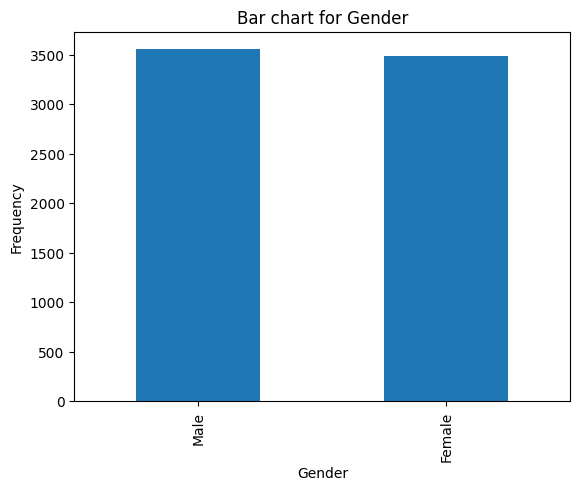

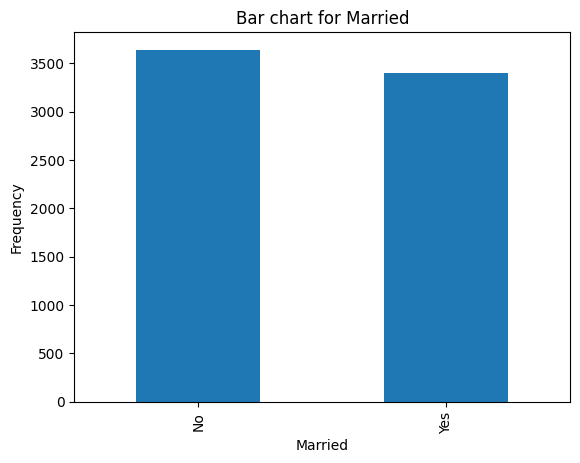

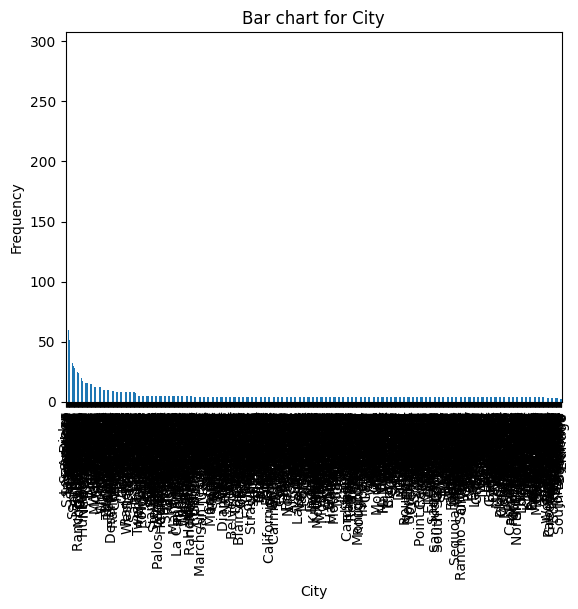

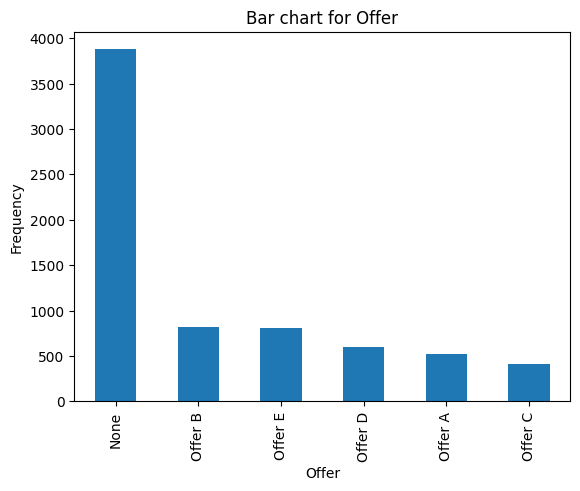

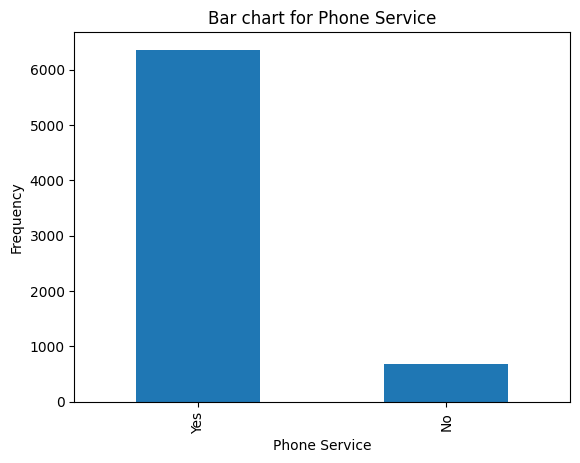

...

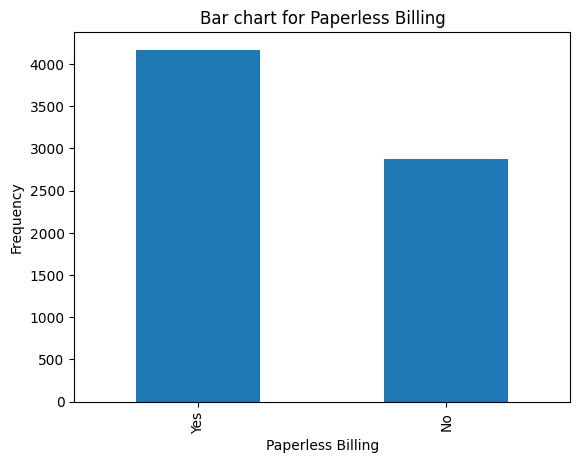

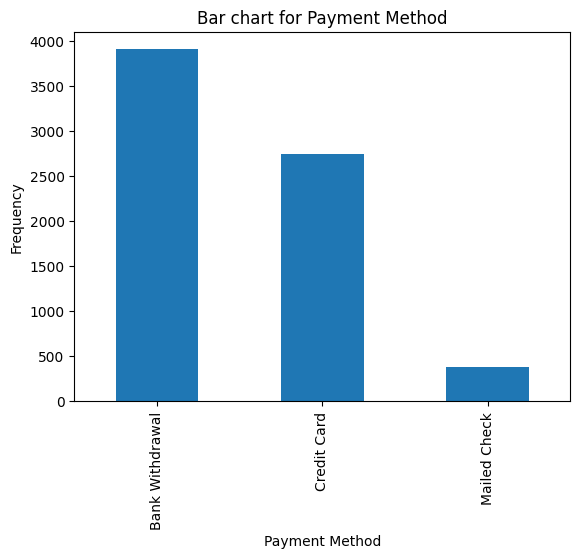

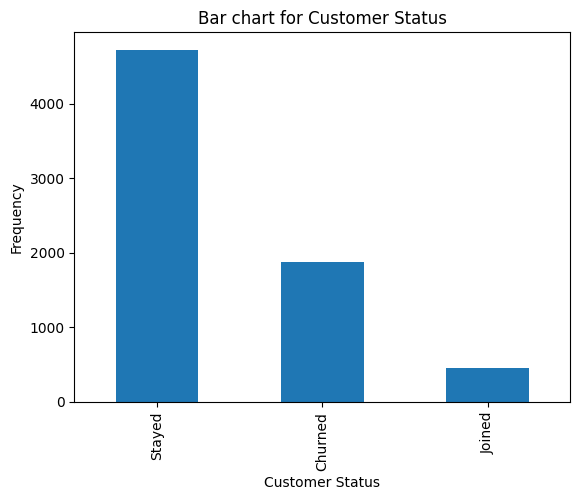

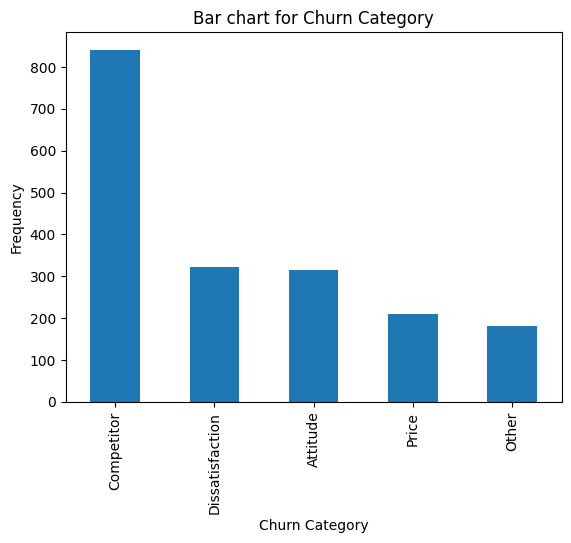

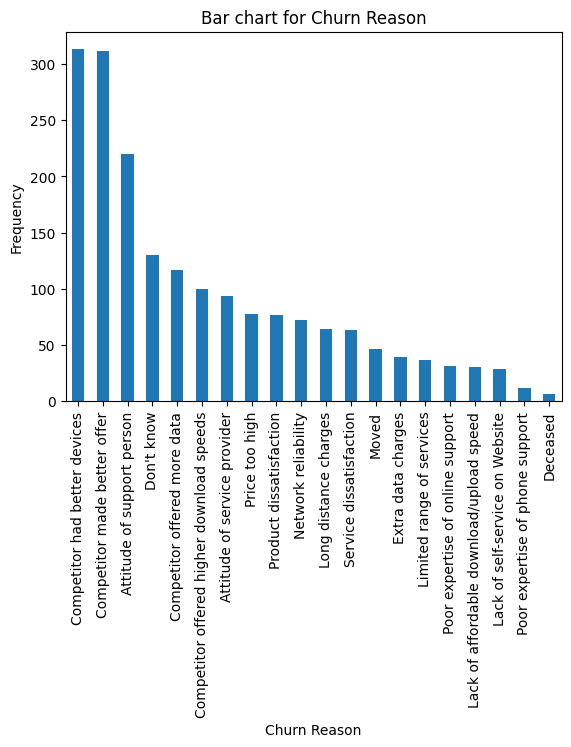

In [12]:
for col in cat_col:
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Bar chart for {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [13]:
df['Gender'].value_counts()

Male      3555
Female    3488
Name: Gender, dtype: int64

In [14]:
df[df['Customer Status']=='Churned']['Churn Reason'].isnull().sum()

0

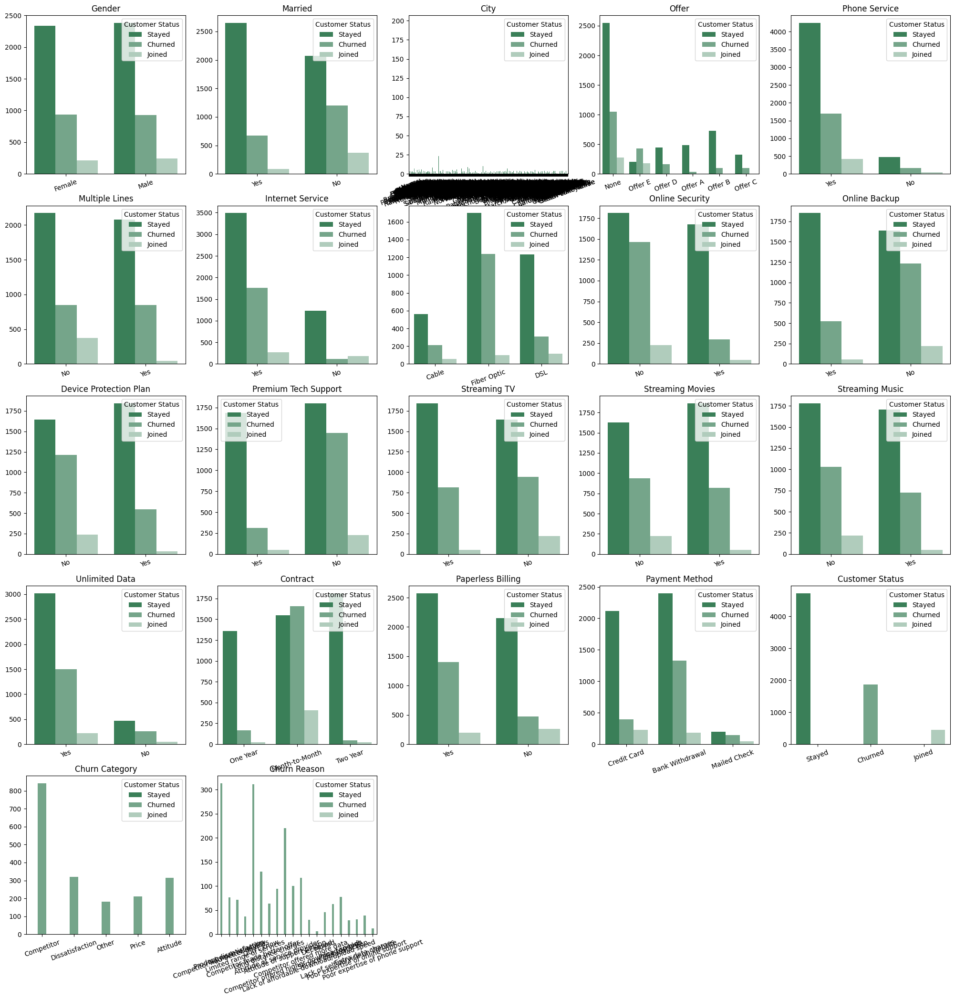

In [15]:
fig = plt.figure(figsize = (25, 25))
palette = sns.light_palette("seagreen", n_colors = 4,reverse=True)
i = 1
for c in df.columns[df.columns.isin(cat_col)]:
    plt.subplot(5, 5, i)
    ax = sns.countplot(data = df, x = df[c], hue = 'Customer Status', palette = palette)
    ax.set(xlabel = None, ylabel = None)
    plt.title(str(c), loc='center')
    plt.xticks(rotation = 20, fontsize = 10)
    i += 1

In [16]:
df['Customer Status'].value_counts()

Stayed     4720
Churned    1869
Joined      454
Name: Customer Status, dtype: int64

/var/folders/1v/57gd2jmd04lg8mxrdxd44x300000gn/T/ipykernel_50035/1542770987.py:17: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()


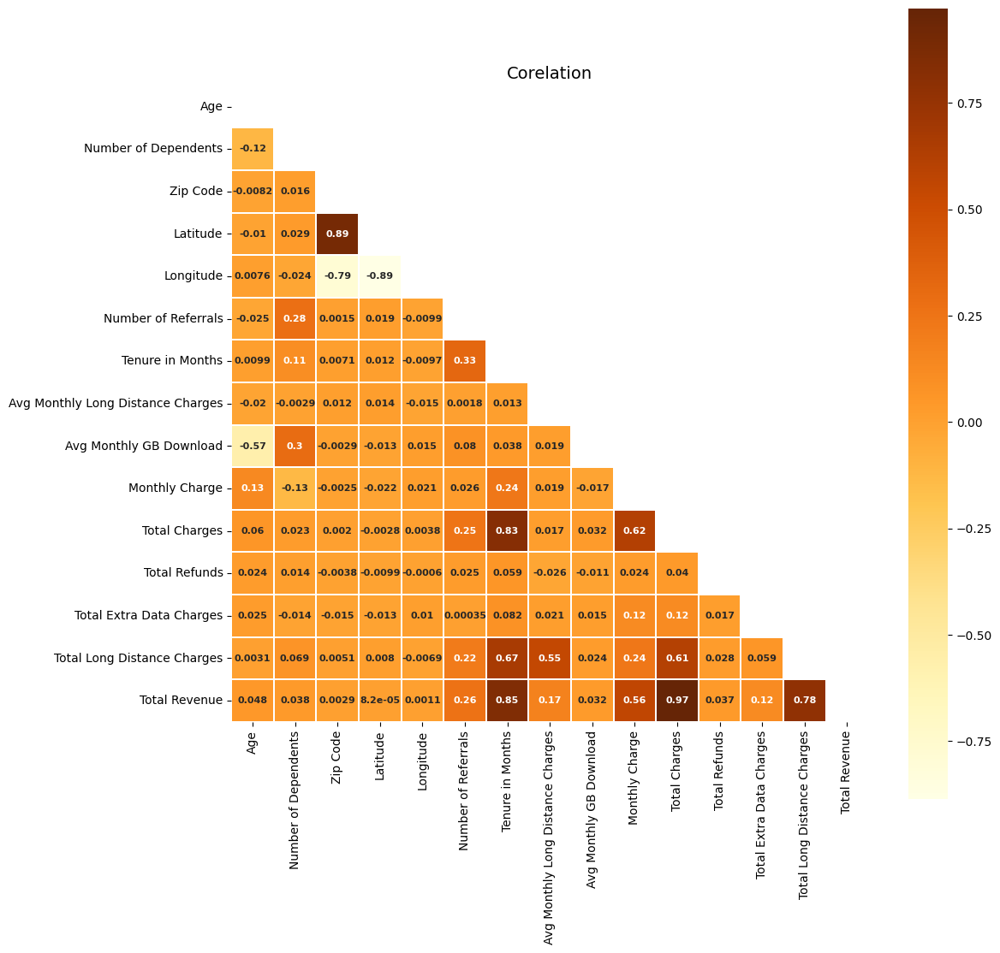

In [17]:
def Generate_heatmap_graph(corr, chart_title, mask_uppertri=False ):
    """ Based on features , generate correlation matrix """
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = mask_uppertri

    fig,ax = plt.subplots(figsize=(12,12))
    sns.heatmap(corr
                , mask = mask
                , square = True
                , annot = True
                , annot_kws={'size': 8, 'weight' : 'bold'}
                , cmap=plt.get_cmap("YlOrBr")
                , linewidths=.1)
    plt.title(chart_title, fontsize=14)
    plt.show()

corr = df.corr()
Generate_heatmap_graph(corr, 'Corelation', mask_uppertri=True)

In [18]:
df.groupby('City')['Customer Status'].count()

City
Acampo          4
Acton           4
Adelanto        5
Adin            4
Agoura Hills    5
               ..
Yreka           4
Yuba City       8
Yucaipa         4
Yucca Valley    5
Zenia           4
Name: Customer Status, Length: 1106, dtype: int64

In [94]:
token = 'pk.eyJ1IjoiYmluaXQxMyIsImEiOiJjbHRyaWQ3dzcwZWNrMnBrOHNtZzVmOTd4In0.c_HGh6IUkJJRBQTiYX9RSw'
px.set_mapbox_access_token(token)
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude",     
                color="Customer Status", size="Tenure in Months",
                  color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=20, zoom=10,hover_data=['Age', 'City'])
fig.show()

In [20]:
churned_df = df[df['Customer Status']=='Churned']

In [25]:
px.set_mapbox_access_token(token)
fig = px.scatter_mapbox(churned_df, lat="Latitude", lon="Longitude",   
                color="Gender", size="Tenure in Months",
                  color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=20, zoom=10,
                        hover_data=['Age','Churn Category','Total Charges', 'Monthly Charge'])
fig.show()

In [22]:
churned_df

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.0,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.0,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.0,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
18,0022-TCJCI,Male,79,No,0,Daly City,94015,37.680844,-122.481310,0,45,None,Yes,10.67,No,Yes,DSL,17.0,Yes,No,Yes,No,No,Yes,No,Yes,One Year,No,Credit Card,62.70,2791.50,0.0,0,480.15,3271.65,Churned,Dissatisfaction,Limited range of services
19,0023-HGHWL,Male,67,No,0,Morgan Hill,95037,37.161544,-121.649371,0,1,None,No,NaN,NaN,Yes,Cable,9.0,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,25.10,25.10,0.0,0,0.00,25.10,Churned,Competitor,Competitor made better offer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7020,9961-JBNMK,Male,79,No,0,Desert Center,92239,33.889605,-115.257009,0,21,None,Yes,42.27,No,Yes,Fiber Optic,7.0,No,No,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,-1.00,2030.30,10.2,0,887.67,2907.77,Churned,Dissatisfaction,Product dissatisfaction
7023,9965-YOKZB,Male,73,No,0,Grizzly Flats,95636,38.636102,-120.522149,0,9,None,Yes,10.04,Yes,Yes,Fiber Optic,13.0,No,No,No,No,No,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,83.85,790.15,0.0,0,90.36,880.51,Churned,Dissatisfaction,Network reliability
7036,9985-MWVIX,Female,53,No,0,Hume,93628,36.807595,-118.901544,0,1,Offer E,Yes,42.09,No,Yes,Fiber Optic,9.0,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,70.15,70.15,0.0,0,42.09,112.24,Churned,Competitor,Competitor had better devices
7037,9986-BONCE,Female,36,No,0,Fallbrook,92028,33.362575,-117.299644,0,4,None,Yes,2.01,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Bank Withdrawal,20.95,85.50,0.0,0,8.04,93.54,Churned,Competitor,Competitor made better offer


In [23]:
churned_df['Churn Category'].value_counts()

Competitor         841
Dissatisfaction    321
Attitude           314
Price              211
Other              182
Name: Churn Category, dtype: int64

<AxesSubplot: >

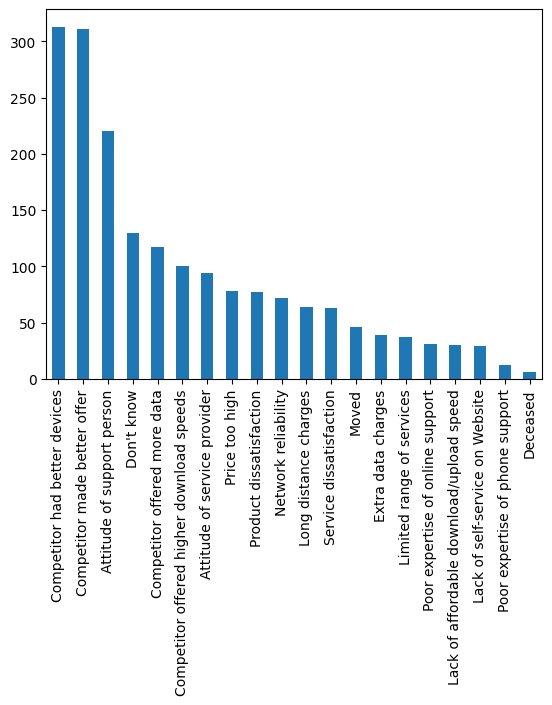

In [24]:
churned_df['Churn Reason'].value_counts().plot(kind='bar')

In [ ]:
feature_importance = pd.Series(clsGB.feature_importances_, x_train.columns)
plt.figure(figsize = (10,8))
feature_importance.sort_values().plot(kind = 'barh')
plt.xlabel("Importance", fontsize = 13)
plt.ylabel("Features", fontsize = 13)
plt.title("Feature importance", fontsize = 14)

In [ ]:
 ['aggrnyl', 'agsunset', 'algae', 'amp', 'armyrose', 'balance',
             'blackbody', 'bluered', 'blues', 'blugrn', 'bluyl', 'brbg',
             'brwnyl', 'bugn', 'bupu', 'burg', 'burgyl', 'cividis', 'curl',
             'darkmint', 'deep', 'delta', 'dense', 'earth', 'edge', 'electric',
             'emrld', 'fall', 'geyser', 'gnbu', 'gray', 'greens', 'greys',
             'haline', 'hot', 'hsv', 'ice', 'icefire', 'inferno', 'jet',
             'magenta', 'magma', 'matter', 'mint', 'mrybm', 'mygbm', 'oranges',
             'orrd', 'oryel', 'oxy', 'peach', 'phase', 'picnic', 'pinkyl',
             'piyg', 'plasma', 'plotly3', 'portland', 'prgn', 'pubu', 'pubugn',
             'puor', 'purd', 'purp', 'purples', 'purpor', 'rainbow', 'rdbu',
             'rdgy', 'rdpu', 'rdylbu', 'rdylgn', 'redor', 'reds', 'solar',
             'spectral', 'speed', 'sunset', 'sunsetdark', 'teal', 'tealgrn',
             'tealrose', 'tempo', 'temps', 'thermal', 'tropic', 'turbid',
             'turbo', 'twilight', 'viridis', 'ylgn', 'ylgnbu', 'ylorbr',
             'ylorrd']

In [111]:
def Generate_heatmap_plotly(corr, chart_title, mask_uppertri=False):
    """Generate a heatmap using Plotly based on the correlation matrix."""
    if mask_uppertri:
        corr = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    
    fig = go.Figure(data=go.Heatmap(
        z=corr.values,
        x=corr.columns,
        y=corr.index,
        colorscale='greens',
    ))

    fig.update_layout(
        title=chart_title,
        width=800,
        height=800,
        xaxis_title='Features',
        yaxis_title='Features'
    )

    fig.show()

corr = df.corr()
Generate_heatmap_plotly(corr, 'Correlation', mask_uppertri=True)

/var/folders/1v/57gd2jmd04lg8mxrdxd44x300000gn/T/ipykernel_50035/62662236.py:23: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [117]:
cat_col

['Gender',
 'Married',
 'Offer',
 'Phone Service',
 'Multiple Lines',
 'Internet Service',
 'Internet Type',
 'Online Security',
 'Online Backup',
 'Device Protection Plan',
 'Premium Tech Support',
 'Streaming TV',
 'Streaming Movies',
 'Streaming Music',
 'Unlimited Data',
 'Contract',
 'Paperless Billing',
 'Payment Method',
 'Customer Status',
 'Churn Category',
 'Churn Reason']

In [129]:
np.random.seed(0)

# Histogram plot
fig_hist = px.histogram(df, x='Age', color='Customer Status', nbins=20, marginal='box', hover_data=df.columns)

fig_hist.show()


In [133]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,7043.0,46.509726,16.750352,19.000000,32.000000,46.000000,60.000000,80.000000
Number of Dependents,7043.0,0.468692,0.962802,0.000000,0.000000,0.000000,0.000000,9.000000
Zip Code,7043.0,93486.070567,1856.767505,90001.000000,92101.000000,93518.000000,95329.000000,96150.000000
Latitude,7043.0,36.197455,2.468929,32.555828,33.990646,36.205465,38.161321,41.962127
Longitude,7043.0,-119.756684,2.154425,-124.301372,-121.788090,-119.595293,-117.969795,-114.192901
Number of Referrals,7043.0,1.951867,3.001199,0.000000,0.000000,0.000000,3.000000,11.000000
Tenure in Months,7043.0,32.386767,24.542061,1.000000,9.000000,29.000000,55.000000,72.000000
Avg Monthly Long Distance Charges,6361.0,25.420517,14.200374,1.010000,13.050000,25.690000,37.680000,49.990000
Avg Monthly GB Download,5517.0,26.189958,19.586585,2.000000,13.000000,21.000000,30.000000,85.000000
Monthly Charge,7043.0,63.596131,31.204743,-10.000000,30.400000,70.050000,89.750000,118.750000


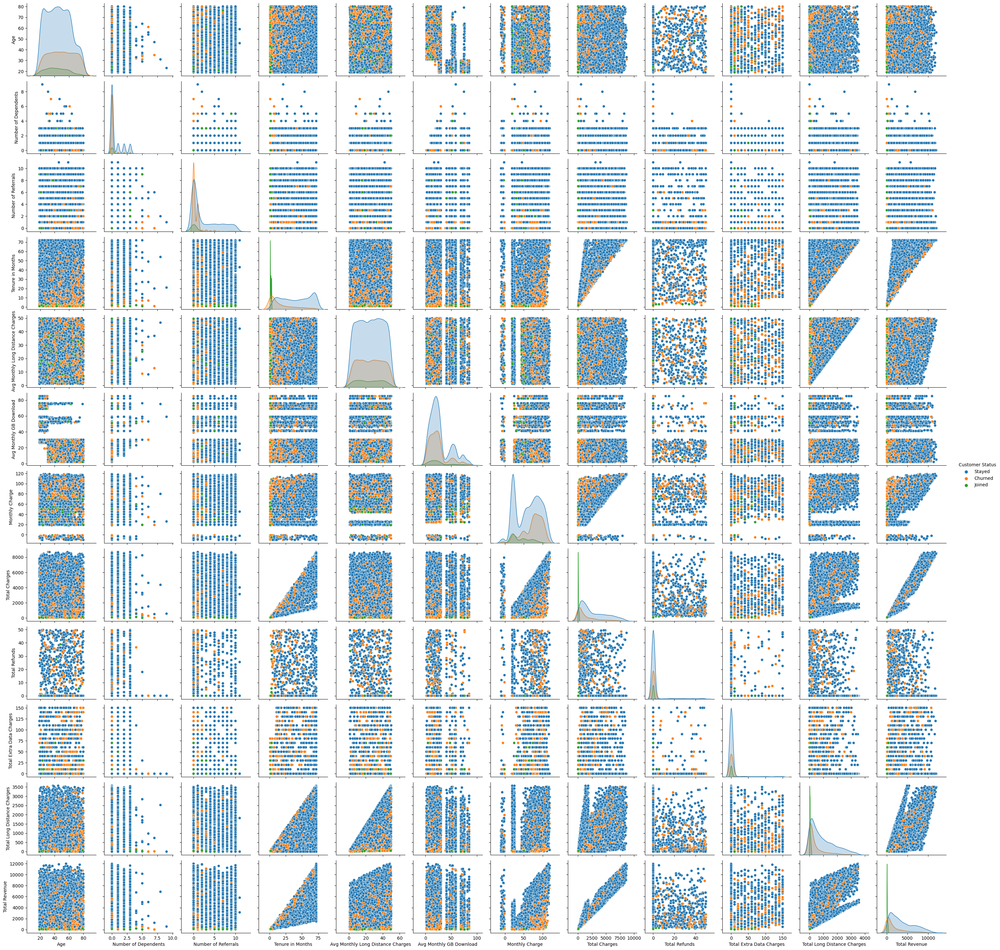

In [ ]:
sns.pairplot(data=df.drop(columns = ['Zip Code','Longitude','Latitude']), hue='Customer Status')
plt.show()

In [149]:
df['Customer Status'].value_counts()

Stayed     4720
Churned    1869
Joined      454
Name: Customer Status, dtype: int64

In [150]:
df[df['Customer Status']=='Joined']

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
17,0021-IKXGC,Female,72,No,0,San Marcos,92078,33.119028,-117.166036,0,1,Offer E,Yes,7.77,Yes,Yes,Fiber Optic,22.0,No,No,No,No,No,No,No,Yes,One Year,Yes,Bank Withdrawal,72.10,72.10,0.0,0,7.77,79.87,Joined,NaN,NaN
23,0030-FNXPP,Female,22,No,0,Keeler,93530,36.560498,-117.962461,0,3,None,Yes,3.12,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,19.85,57.20,0.0,0,9.36,66.56,Joined,NaN,NaN
48,0082-LDZUE,Male,54,No,0,Calistoga,94515,38.629618,-122.593216,0,1,Offer E,Yes,42.95,No,Yes,DSL,9.0,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,44.30,44.30,0.0,0,42.95,87.25,Joined,NaN,NaN
88,0139-IVFJG,Female,19,Yes,0,Temecula,92592,33.507255,-117.029473,10,2,None,Yes,4.65,No,Yes,Fiber Optic,53.0,Yes,Yes,No,No,Yes,No,No,Yes,Month-to-Month,No,Bank Withdrawal,90.35,190.50,0.0,0,9.30,199.80,Joined,NaN,NaN
100,0178-CIIKR,Female,60,No,0,Crows Landing,95313,37.435664,-121.049056,0,3,None,Yes,2.69,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,19.95,58.00,0.0,0,8.07,66.07,Joined,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6938,9840-EFJQB,Female,43,No,0,Sylmar,91342,34.321621,-118.399841,0,1,None,Yes,24.41,No,Yes,Fiber Optic,4.0,No,Yes,No,No,No,No,No,Yes,Month-to-Month,No,Bank Withdrawal,74.35,74.35,0.0,0,24.41,98.76,Joined,NaN,NaN
6973,9895-VFOXH,Female,19,No,0,Scotia,95565,40.440636,-124.098739,0,1,None,No,NaN,NaN,Yes,DSL,76.0,No,No,No,No,No,No,Yes,No,Month-to-Month,No,Credit Card,24.40,24.40,0.0,10,0.00,34.40,Joined,NaN,NaN
7021,9962-BFPDU,Female,61,Yes,3,Kenwood,95452,38.419525,-122.521585,3,1,None,Yes,16.02,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,20.05,20.05,0.0,0,16.02,36.07,Joined,NaN,NaN
7033,9975-SKRNR,Male,24,No,0,Sierraville,96126,39.559709,-120.345639,0,1,Offer E,Yes,49.51,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,18.90,18.90,0.0,0,49.51,68.41,Joined,NaN,NaN


In [151]:
df.isna().sum()

Customer ID                             0
Gender                                  0
Age                                     0
Married                                 0
Number of Dependents                    0
City                                    0
Zip Code                                0
Latitude                                0
Longitude                               0
Number of Referrals                     0
Tenure in Months                        0
Offer                                   0
Phone Service                           0
Avg Monthly Long Distance Charges     682
Multiple Lines                        682
Internet Service                        0
Internet Type                        1526
Avg Monthly GB Download              1526
Online Security                      1526
Online Backup                        1526
Device Protection Plan               1526
Premium Tech Support                 1526
Streaming TV                         1526
Streaming Movies                  

In [153]:
df[df['Avg Monthly GB Download'].isna()]

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
20,0023-UYUPN,Female,79,Yes,0,Ahwahnee,93601,37.375816,-119.739935,0,50,None,Yes,31.43,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,One Year,No,Bank Withdrawal,25.20,1306.30,0.00,0,1571.50,2877.80,Stayed,NaN,NaN
23,0030-FNXPP,Female,22,No,0,Keeler,93530,36.560498,-117.962461,0,3,None,Yes,3.12,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,19.85,57.20,0.00,0,9.36,66.56,Joined,NaN,NaN
24,0031-PVLZI,Female,34,Yes,0,Korbel,95550,40.766600,-123.804580,0,4,Offer E,Yes,12.43,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,20.35,76.35,0.00,0,49.72,126.07,Churned,Price,Long distance charges
27,0040-HALCW,Male,42,Yes,3,Modesto,95358,37.612612,-121.108568,3,54,None,Yes,19.70,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Two Year,No,Credit Card,20.40,1090.60,0.00,0,1063.80,2154.40,Stayed,NaN,NaN
28,0042-JVWOJ,Male,64,No,0,Glen Ellen,95442,38.368744,-122.522642,0,26,Offer C,Yes,37.70,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,One Year,Yes,Bank Withdrawal,19.60,471.85,21.25,0,980.20,1430.80,Stayed,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7026,9970-QBCDA,Female,50,No,0,March Air Reserve Base,92518,33.888323,-117.277533,0,6,Offer E,Yes,31.02,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,19.70,129.55,0.00,0,186.12,315.67,Stayed,NaN,NaN
7028,9972-EWRJS,Female,56,Yes,1,Meadow Valley,95956,39.937017,-121.058043,2,67,Offer A,Yes,48.75,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Two Year,Yes,Bank Withdrawal,19.25,1372.90,0.00,0,3266.25,4639.15,Stayed,NaN,NaN
7032,9975-GPKZU,Male,62,Yes,3,Alameda,94501,37.774633,-122.274434,0,46,None,Yes,7.67,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Two Year,No,Credit Card,19.75,856.50,0.00,0,352.82,1209.32,Stayed,NaN,NaN
7033,9975-SKRNR,Male,24,No,0,Sierraville,96126,39.559709,-120.345639,0,1,Offer E,Yes,49.51,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Month-to-Month,No,Credit Card,18.90,18.90,0.00,0,49.51,68.41,Joined,NaN,NaN


,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20,No,0,La Mesa,91941,32.759327,-116.997260,0,13,Offer D,Yes,46.68,No,Yes,DSL,59.0,Yes,No,No,Yes,No,No,Yes,Yes,One Year,No,Credit Card,55.15,742.90,0.00,0,606.84,1349.74,Stayed,NaN,NaN
7039,9992-RRAMN,Male,40,Yes,0,Riverbank,95367,37.734971,-120.954271,1,22,Offer D,Yes,16.20,Yes,Yes,Fiber Optic,17.0,No,No,No,No,No,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,85.10,1873.70,0.00,0,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22,No,0,Elk,95432,39.108252,-123.645121,0,2,Offer E,Yes,18.62,No,Yes,DSL,51.0,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,50.30,92.75,0.00,0,37.24,129.99,Joined,NaN,NaN
7041,9993-LHIEB,Male,21,Yes,0,Solana Beach,92075,33.001813,-117.263628,5,67,Offer A,Yes,2.12,No,Yes,Cable,58.0,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Two Year,No,Credit Card,67.85,4627.65,0.00,0,142.04,4769.69,Stayed,NaN,NaN
